In [1]:
import scipy
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import pyfits
from scipy import signal


import src.utils as utils
import src.disp as disp
import src.denoising as denoising
import src.starlets as starlets
import src.bss as bss

%load_ext autoreload
%autoreload 2
%matplotlib inline

# Load data

In [2]:
data = pyfits.open('../data/planck/Data.fits')[0].data
kernels = pyfits.open('../data/planck/kernel.fits')[0].data
fwhm = pyfits.open('../data/planck/FWHM.fits')[0].data
pow_spec = pyfits.open('../data/planck/PowSpec.fits')[0].data

# Load noise
sigma_noise = pyfits.open('../data/planck/SigmaNoise.fits')[0].data
noise_realization = pyfits.open('../data/planck/NoiseRealisation.fits')[0].data

# Load spectral info
spec_cmb = pyfits.open('../data/planck/SpecCMB.fits')[0].data
spec_sz = pyfits.open('../data/planck/SpecSZ.fits')[0].data
pow_spec = pyfits.open('../data/planck/PowSpec.fits')[0].data

def print_description(fits_object):
    print(fits_object.shape)
    print (fits_object)
    

/usr/local/lib/python3.4/dist-packages/pyfits/file.py:319: UserWarning: File may have been truncated: actual file length (1575744) is smaller than the expected size (1578240)
  (self.size, pos))
/usr/local/lib/python3.4/dist-packages/pyfits/file.py:319: UserWarning: File may have been truncated: actual file length (2904) is smaller than the expected size (5760)
  (self.size, pos))
/usr/local/lib/python3.4/dist-packages/pyfits/file.py:319: UserWarning: File may have been truncated: actual file length (265024) is smaller than the expected size (267840)
  (self.size, pos))


# Load inputs

In [3]:
cmb_5arcmin = pyfits.open('../data/input/cmb_5arcmin.fits')[0].data
dust_5arcmin = pyfits.open('../data/input/dust_5arcmin.fits')[0].data
sz_5arcmin = pyfits.open('../data/input/sz_5arcmin.fits')[0].data

/usr/local/lib/python3.4/dist-packages/pyfits/file.py:319: UserWarning: File may have been truncated: actual file length (265024) is smaller than the expected size (267840)
  (self.size, pos))



# Observations

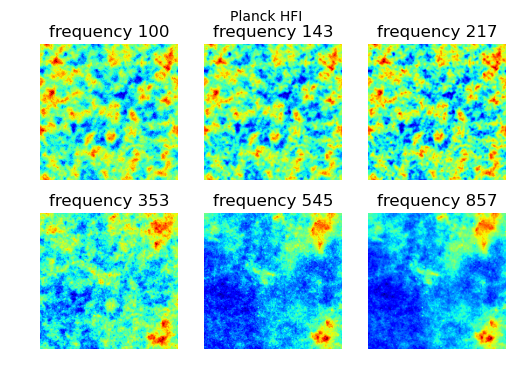

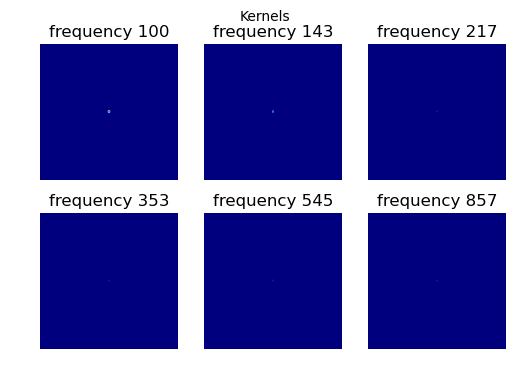

In [4]:
frequencies = [100, 143, 217, 353, 545, 857 ]
disp.display_cube(data, 'frequency', frequencies, 'Planck HFI')

disp.display_cube(kernels, 'frequency', frequencies, 'Kernels')

Verify that the 4 last psf functions are identical

In [5]:
np.all(kernels[3]==kernels[4])

True

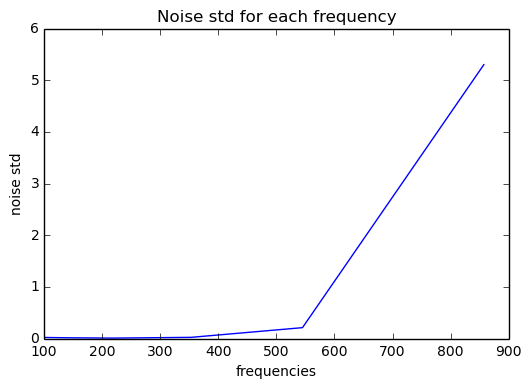

In [8]:
plt.plot(frequencies, sigma_noise)
plt.xlabel('frequencies')
plt.ylabel('noise std')
plt.title('Noise std for each frequency')
plt.show()

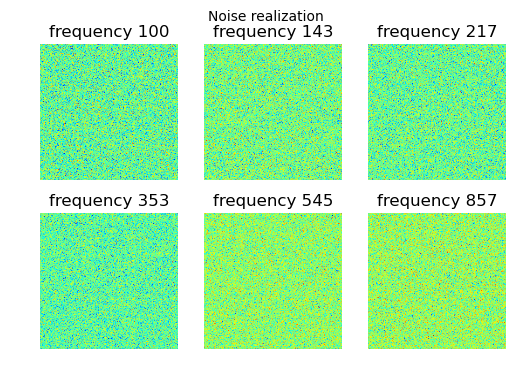

In [9]:
disp.display_cube(noise_realization, 'frequency', frequencies, 'Noise realization')

## Check noise estimation

In [10]:
sigm_errors = []
for idx in range(6):
    theoretical_noise = sigma_noise[idx][0]
    estimated_noise = np.std(noise_realization[idx])
    print('sigma : {sigma:.3f}, estimated std : {std:.3f}'.format(std=estimated_noise,
                                                         sigma=theoretical_noise))
    sigm_errors.append(100 * np.abs(theoretical_noise - estimated_noise) / estimated_noise )

print(sigm_errors)

sigma : 0.020, estimated std : 0.020
sigma : 0.014, estimated std : 0.014
sigma : 0.008, estimated std : 0.008
sigma : 0.022, estimated std : 0.022
sigma : 0.210, estimated std : 0.209
sigma : 5.300, estimated std : 5.283
[0.43181625345361663, 0.38091129377234323, 0.081581352488424616, 0.075109741609967751, 0.3752946278638099, 0.31379575902355722]


# Step 1 : image denoising

In [11]:
noise = np.random.normal(0, 1, [256, 256])
wavelet_nb = 5 
starlet_coeffs_noise, residual_coeff_noise = starlets.starlet_transform(noise, wavelet_nb, display=False)

frequency  100


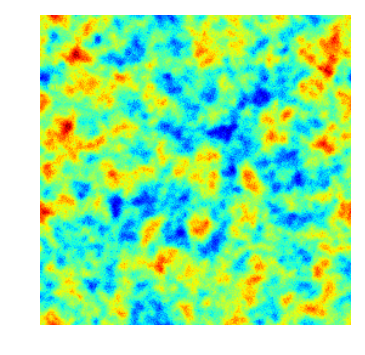

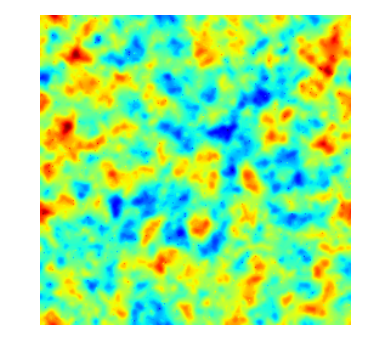

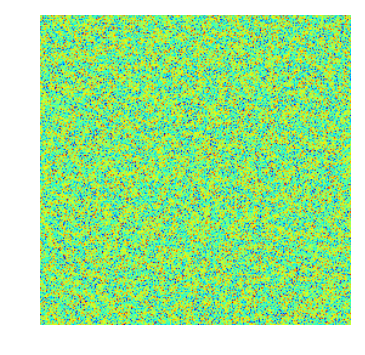

frequency  143


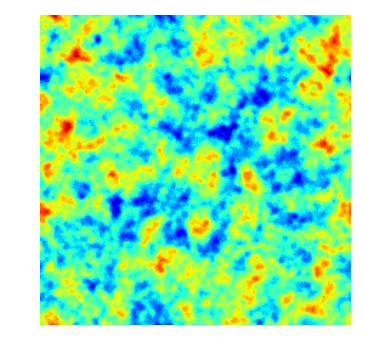

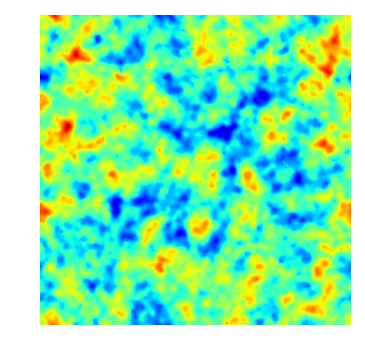

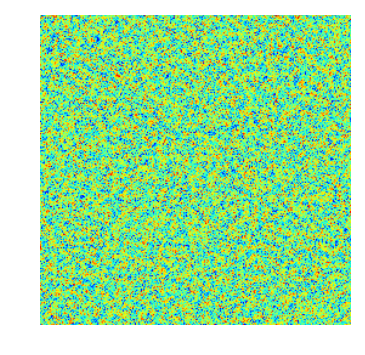

frequency  217


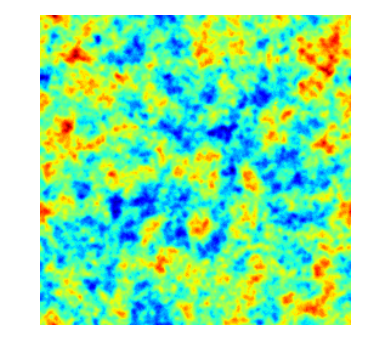

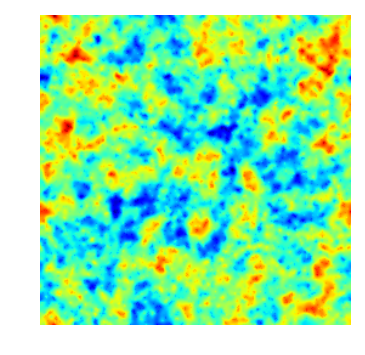

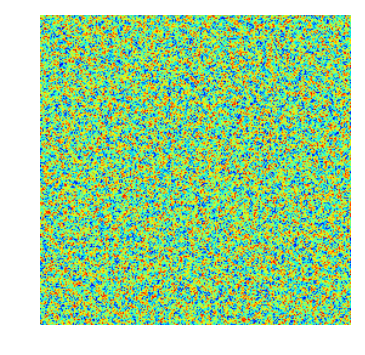

frequency  353


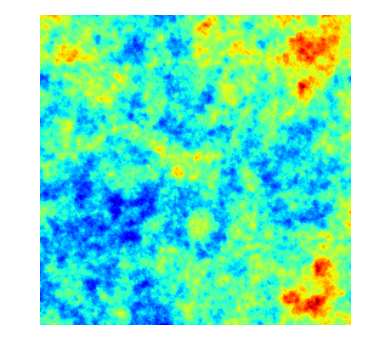

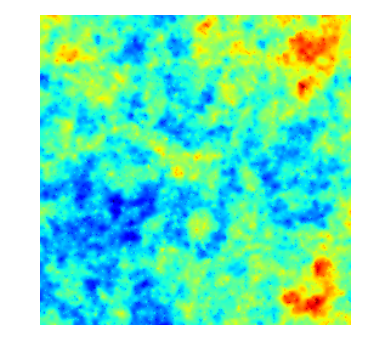

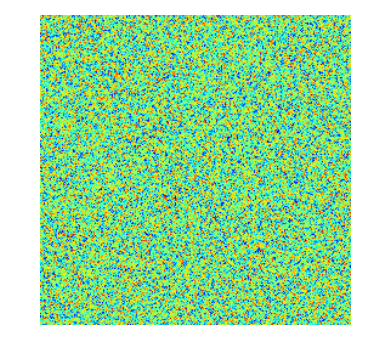

frequency  545


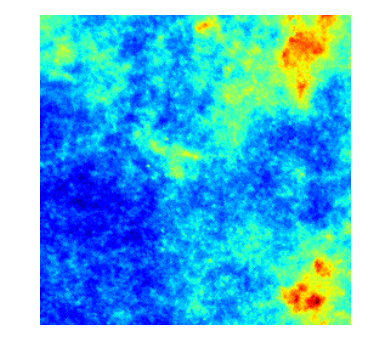

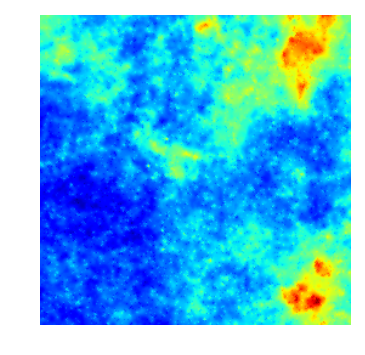

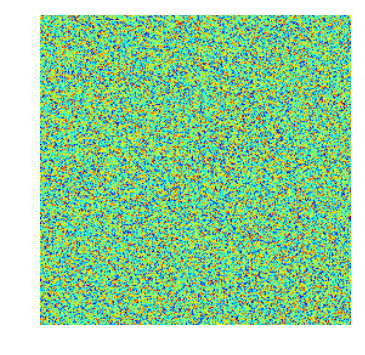

frequency  857


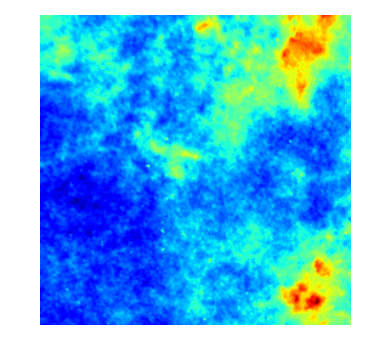

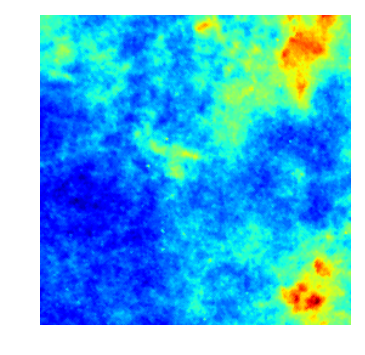

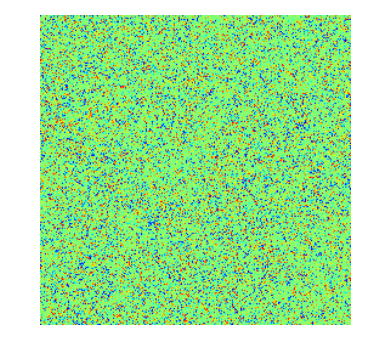

In [12]:
mad_noise = denoising.compute_mad_at_scales(starlet_coeffs_noise, residual_coeff_noise)

display=True
denoised_data = []
removed_noises = []
for idx_images in range(6):
    print('frequency ', frequencies[idx_images])
    image_noise_std = sigma_noise[idx_images][0]
    current_image = data[idx_images]
    starlet_coeffs_noised, fin_noised = starlets.starlet_transform(current_image, wavelet_nb, display=False)
    estimated_stds = [image_noise_std*noise_level for noise_level in mad_noise]
    k_thresholds = [3*stds for stds in estimated_stds]
    reconstruct, coeff_count = denoising.multires_reconstruc(starlet_coeffs_noised, fin_noised, k_thresholds)
    denoised_data.append(reconstruct)
    removed_noise = current_image - reconstruct
    removed_noises.append(removed_noise)
    if(display):
        # Display original image
        plt.imshow(current_image)
        plt.axis("off")
        plt.show()
        # Display denoised version
        plt.imshow(reconstruct)
        plt.axis("off")
        plt.show()
        # Display difference
        plt.imshow(removed_noise)
        plt.axis("off")
        plt.show()

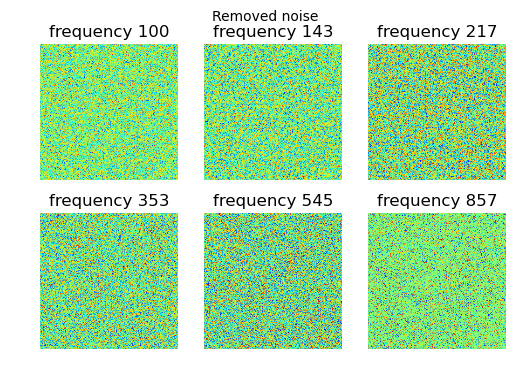

In [14]:
# Display differences between original and reconstructs
disp.display_cube(removed_noises, 'frequency', frequencies, main_title='Removed noise')

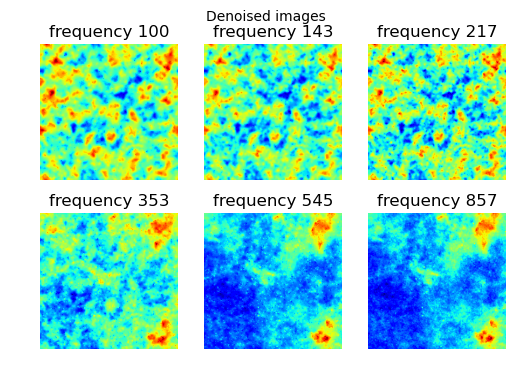

In [15]:
# Display differences between original and reconstructs
disp.display_cube(denoised_data, 'frequency', frequencies, main_title='Denoised images')

# Step 2 : Deconvolution

In [16]:
deconved_data = []
for idx_im in range(len(data)):
    deconved_data.append(utils.prox_deconvolution(denoised_data[idx_im], kernels[idx_im],
                                                  nmax=np.inf, tol=5e-3))

final error :  0.0048187628192
iteration number :  9
final error :  0.00419254507754
iteration number :  8
final error :  0.00459634062163
iteration number :  5
final error :  0.00356697668983
iteration number :  3
final error :  0.00260884606676
iteration number :  3
final error :  0.00403304006173
iteration number :  2


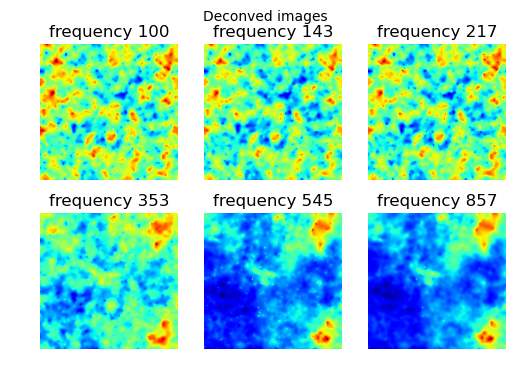

In [17]:
disp.display_cube(deconved_data, 'frequency', frequencies, 'Deconved images')

frequency  100


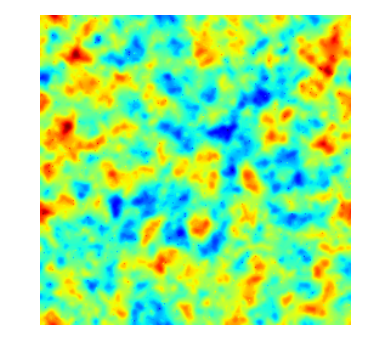

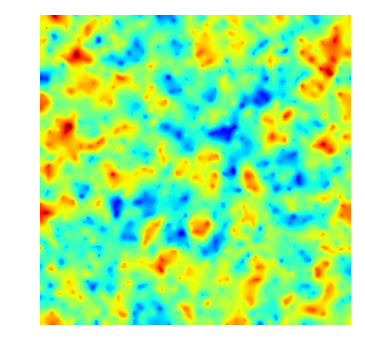

frequency  143


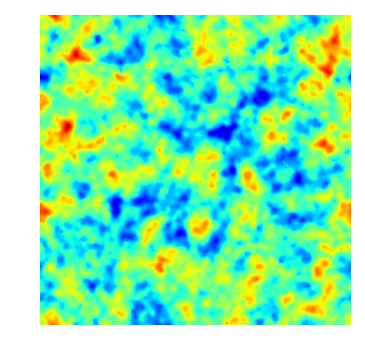

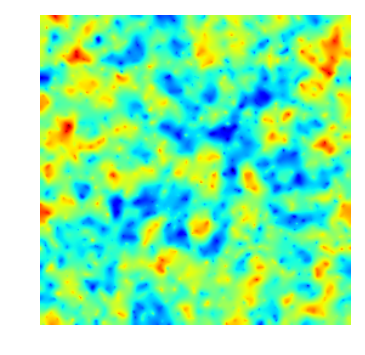

frequency  217


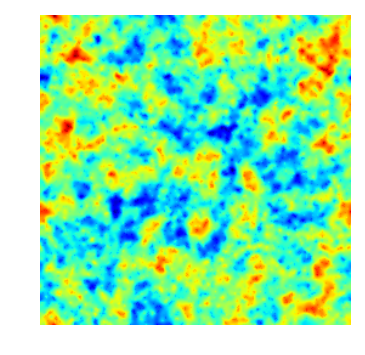

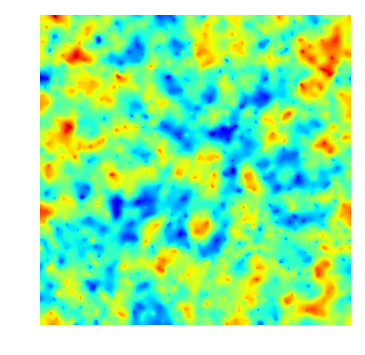

frequency  353


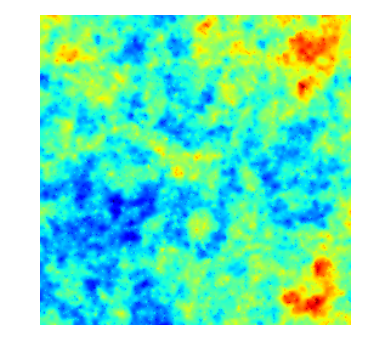

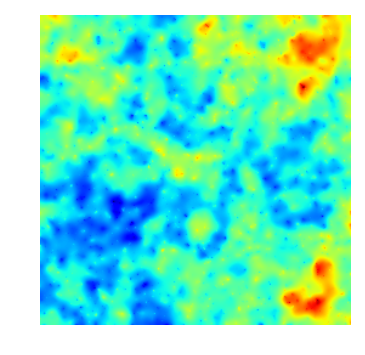

frequency  545


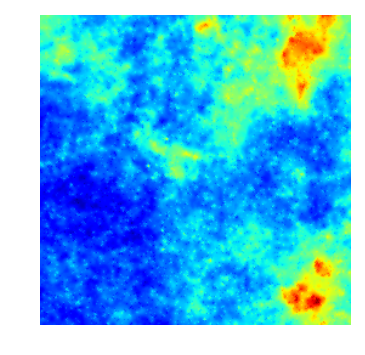

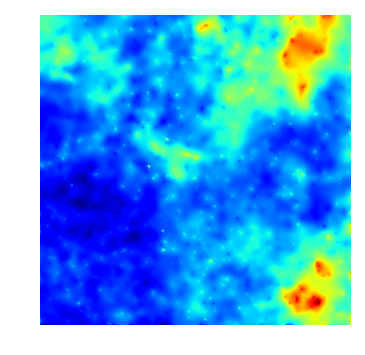

frequency  857


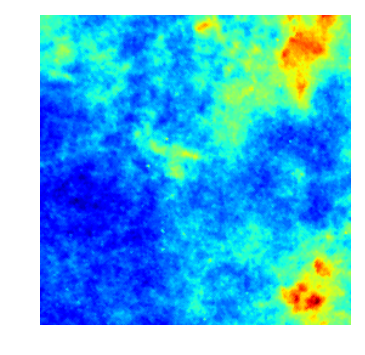

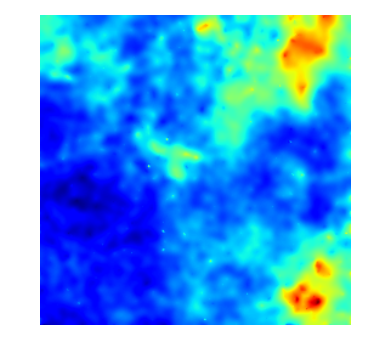

In [19]:
for it in range(6):
    print("frequency ", frequencies[it])
    plt.imshow(denoised_data[it])
    plt.axis("off")
    plt.show()
    plt.imshow(deconved_data[it])
    plt.axis("off")
    plt.show()

In [23]:
deconved_data_conv = []
for idx_im in range(len(data)):
    deconved = utils.prox_deconvolution(denoised_data[idx_im], kernels[idx_im],
                                                  nmax=np.inf, tol=1e-5)
    conv_deconved = scipy.signal.convolve2d(deconved, kernels[5], mode="same", boundary="symm")
    deconved_data_conv.append(conv_deconved)

final error :  9.98433807853e-06
iteration number :  1047
final error :  9.99516838995e-06
iteration number :  357
final error :  9.73682643187e-06
iteration number :  118
final error :  9.74258320482e-06
iteration number :  89
final error :  9.92472693067e-06
iteration number :  122
final error :  9.97353310557e-06
iteration number :  91


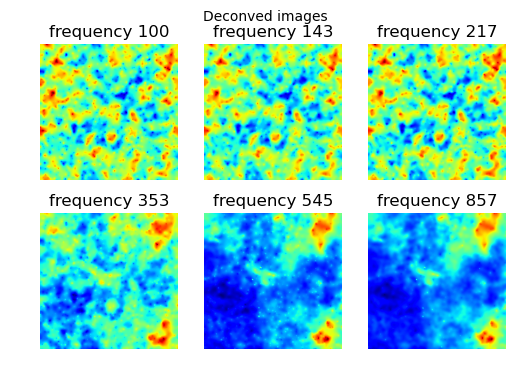

In [24]:
disp.display_cube(deconved_data_conv, 'frequency', frequencies, 'Deconved images')

frequency  100


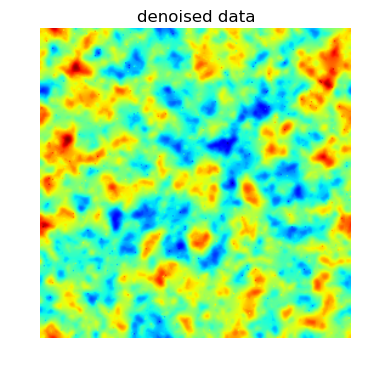

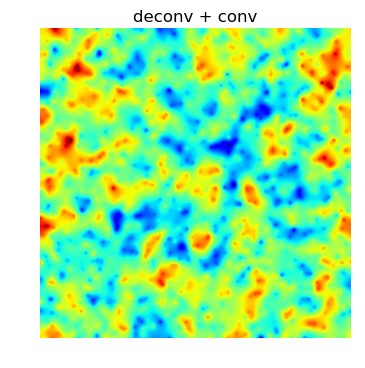

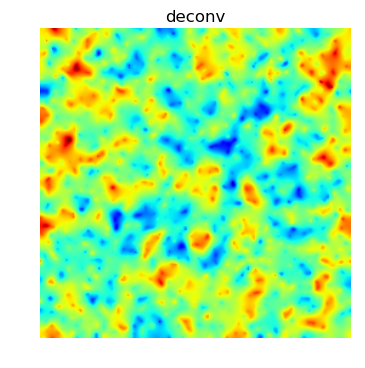

frequency  143


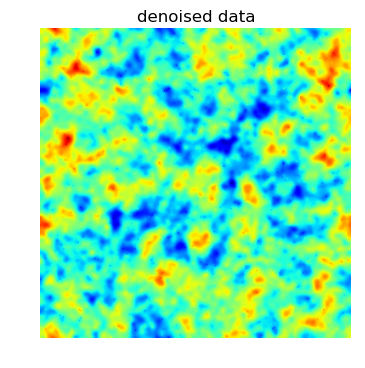

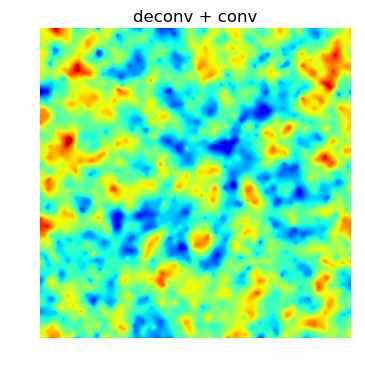

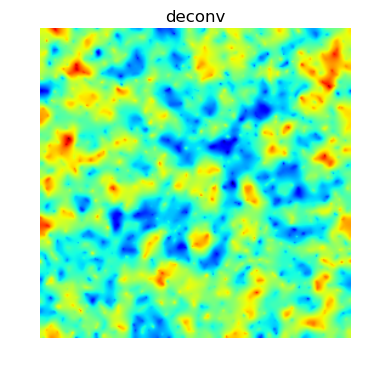

frequency  217


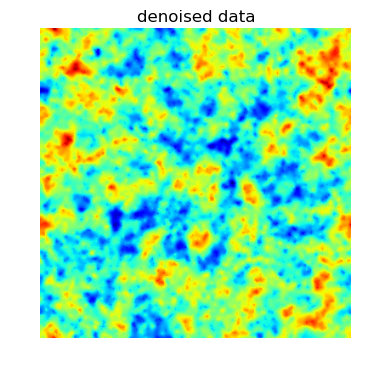

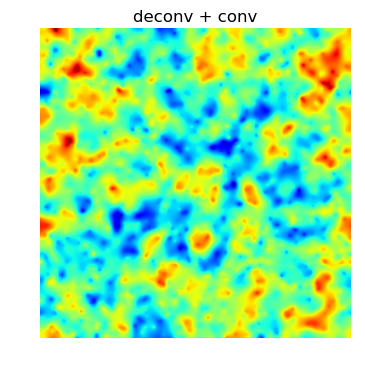

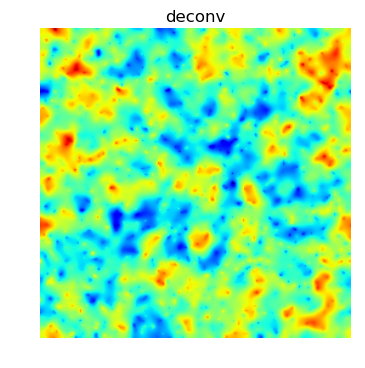

frequency  353


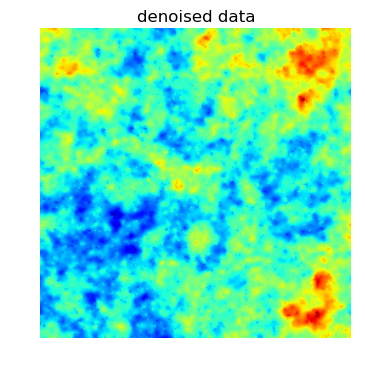

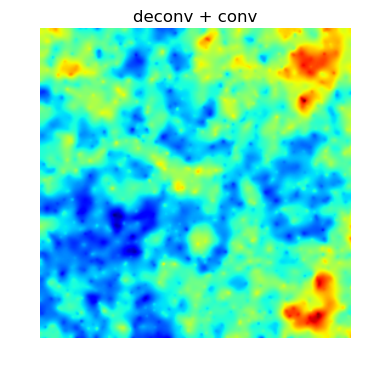

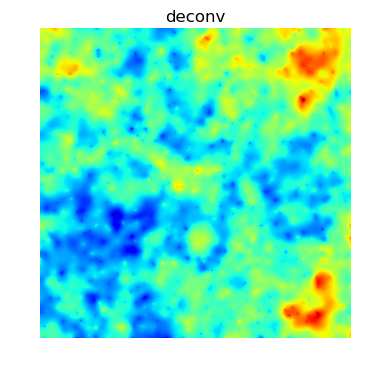

frequency  545


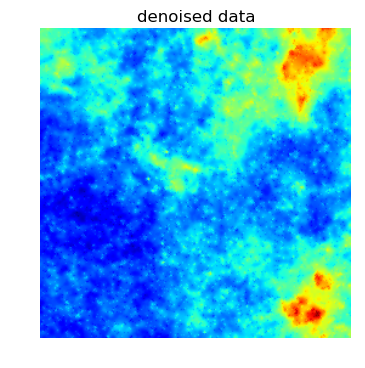

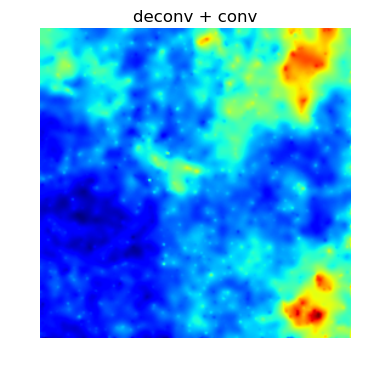

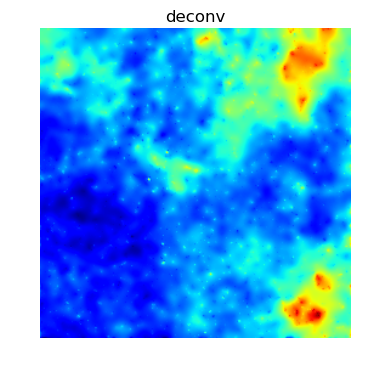

frequency  857


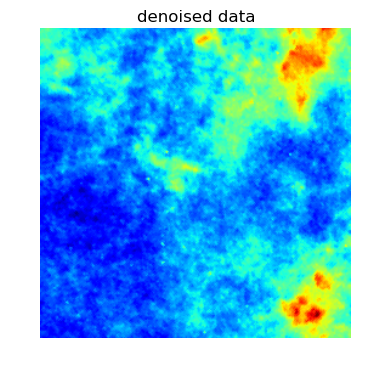

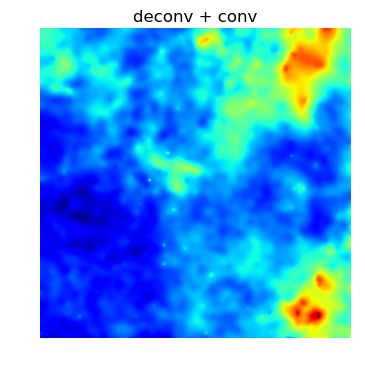

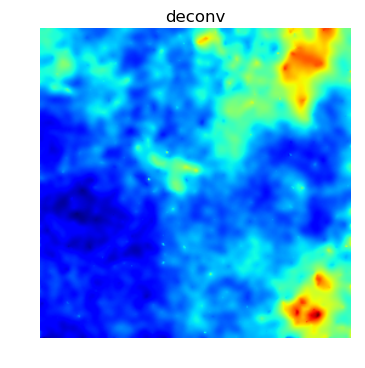

In [25]:
for it in range(6):
    print("frequency ", frequencies[it])
    plt.imshow(denoised_data[it])
    plt.title("denoised data")
    plt.axis("off")
    plt.show()
    plt.imshow(deconved_data_conv[it])
    plt.title("deconv + conv")
    plt.axis("off")
    plt.show()
    plt.imshow(deconved_data[it])
    plt.title("deconv")
    plt.axis("off")
    plt.show()

# Step 3 : Source separation

## Gather clean data (after denoising and deconvolution)

We keep the non-deconvoluted verses for the images that were acquired with sufficient resolution.

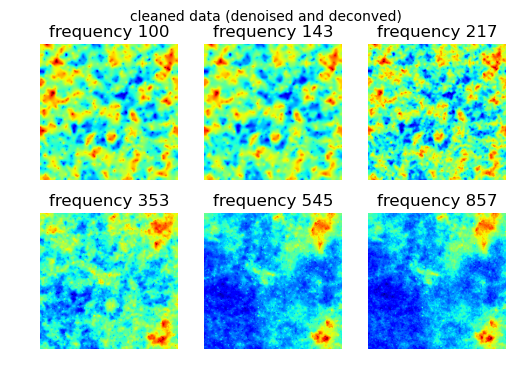

In [26]:
cleaned_images = [deconved_data_conv[0], deconved_data_conv[1]] 
cleaned_images[2:6] = denoised_data[2:6]
disp.display_cube(cleaned_images, 'frequency', frequencies, 'cleaned data (denoised and deconved)')

In [27]:
mixed_data = np.zeros([6, 256*256])
for idx_image in range(6):
    mixed_data[idx_image,] = cleaned_images[idx_image].reshape(1, 256*256)

def images_to_sparse_mixed_matrix(images, wavelet_nb, im_size=256):
    """
    Turns list of observations in image format into array of sparse sources
    :param images: list of square observation images
    :param wavelet_nb: scale of the starlet decomposition
    :return mixed_matrix: nb of rows is nb of images, nb of cols is (size of image)^2*wavelet_nb  
    """
    fin_coeffs = np.zeros([6, im_size*im_size])
    mixed_matrix = np.zeros([6, im_size*im_size*wavelet_nb])
    for image_idx, image in enumerate(images):
        image_starlet_coeffs, image_fin_coeffs = starlets.starlet_transform(image, wavelet_nb)
        for wavelet_idx, wavelet_coeff in enumerate(image_starlet_coeffs):
            mixed_matrix[image_idx, im_size*im_size*wavelet_idx: im_size*im_size*(wavelet_idx+1)] = wavelet_coeff.reshape(1, 256*256)
        fin_coeffs[image_idx, ] = image_fin_coeffs.reshape(1, 256*256)
    return mixed_matrix, fin_coeffs

def sources_to_images(mixed_matrix, fin_coeffs, im_size=256, display=False):
    """
    Turns array of sources as returned by images_to_sparse_mixed_matrix into list of images
    :param im_size: original size of the square images
    :return sources: list of reconstructed sources, each source in shape im_size*im_size
    """
    nb_source, spatial_size = mixing_matrix.shape
    sources = []
    for idx_obs, row_source in enumerate(mixed_matrix):
        nb_wavelets = int(row_source.shape[0]/(im_size*im_size))
        wavelet_coeffs = np.zeros([nb_wavelets, im_size, im_size])
        for idx_wavelet in range(nb_wavelets):
            flat_coeffs = row_source[idx_wavelet*im_size*im_size:(idx_wavelet+1)*im_size*im_size]
            wavelet_coeffs[idx_wavelet] = flat_coeffs.reshape(im_size, im_size)
        fin_im_coeff = fin_coeffs[idx_obs].reshape(im_size, im_size)
        source_img = starlets.starlet_reconstruct(wavelet_coeffs, fin_im_coeff)
        sources.append(source_img)
        if(display):
            plt.imshow(source_img)
            plt.show()
    return sources


We then perform the source separation on the wavelet representation of the observations.

In [28]:
starlet_mixed_matrix, fin_starlet_mixed_coeffs = images_to_sparse_mixed_matrix(cleaned_images, 5)

In [102]:
source_nb = 3
spec_sz_coeffs = spec_sz.flatten().tolist()
spec_cmb_coeffs = spec_cmb.flatten().tolist()
mixing_matrix, sources, pinv_mixing_matrix = bss.perform_gmca_planck(starlet_mixed_matrix, source_nb, nmax=5000,
                                                 colcmb=spec_cmb_coeffs, colsz=spec_sz_coeffs, rescale=True)

In [103]:
unmixed_fin = np.dot(pinv_mixing_matrix, np.asarray(fin_starlet_mixed_coeffs))

In [104]:
results = sources_to_images(sources, unmixed_fin)

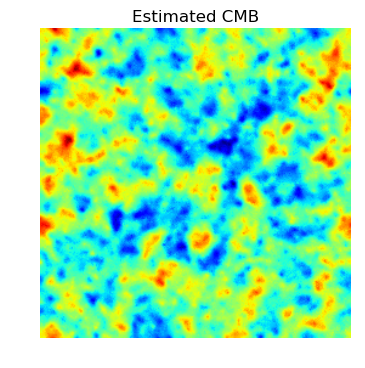

(-0.5, 255.5, 255.5, -0.5)

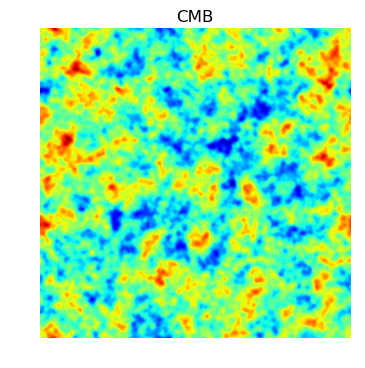

In [105]:
plt.imshow(results[0])
plt.title("Estimated CMB")
plt.axis("off")
plt.show()
plt.imshow(cmb_5arcmin)
plt.title('CMB')
plt.axis('off') 

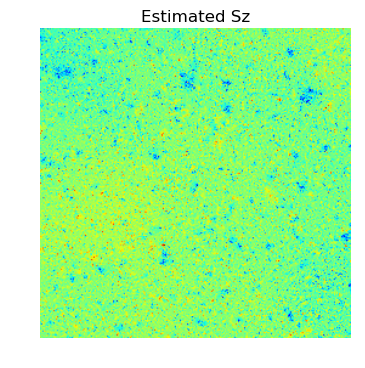

(-0.5, 255.5, 255.5, -0.5)

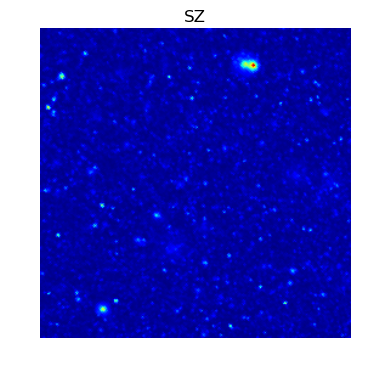

In [108]:
plt.imshow(-results[1])
plt.title("Estimated Sz")
plt.axis("off")
plt.show()
plt.imshow(sz_5arcmin)
plt.title('SZ')
plt.axis('off') 

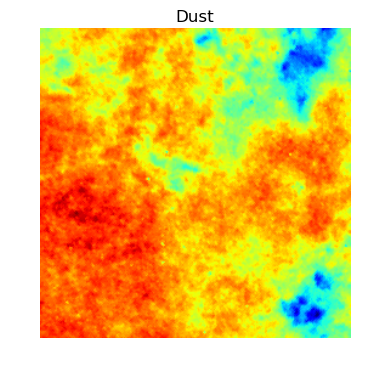

(-0.5, 255.5, 255.5, -0.5)

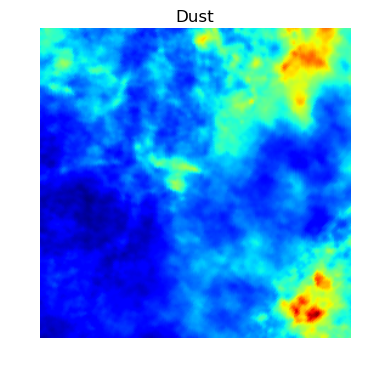

In [107]:
plt.imshow(-results[2])
plt.title("Dust")
plt.axis("off")
plt.show()
plt.imshow(dust_5arcmin)
plt.title('Dust')
plt.axis('off') 

## Annexe 1 : visualization of the spectrums

We therefore see that the estimated std is coherent with the noise realizations.

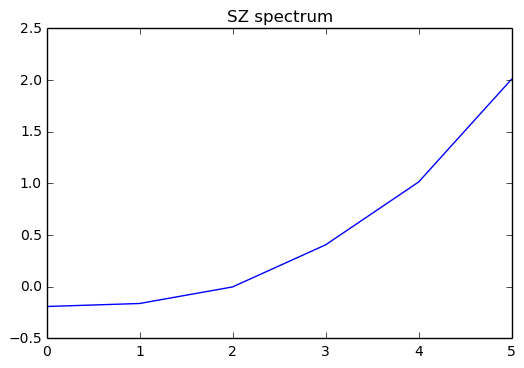

In [633]:
plt.plot(spec_sz.squeeze())
plt.title('SZ spectrum')
plt.show()

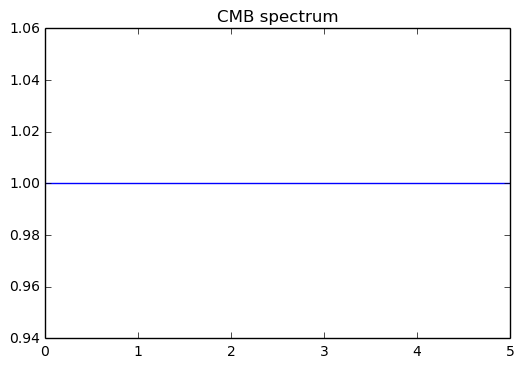

In [74]:
plt.plot(spec_cmb.squeeze())
plt.title('CMB spectrum')
plt.show()

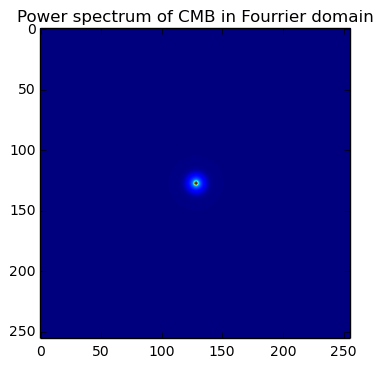

In [77]:
plt.imshow(pow_spec)
plt.title('Power spectrum of CMB in Fourrier domain')
plt.show()

# Annexe 2 : Generate artificial CMB

The power spectrum of the CMB in the Fourier domain allows us to generate images which statistics resemble the real CMB's. The CMB map is theoretically modeled in the Fourier domain as 
x[k] = PowSpec[k] u[k] where u is a white Gaussian noise with variance of 1. 

We could therefore 'generate' CMB by taking the following steps :

- generating a white noise whith variance of 1

- taking its Hadamard product with PowSpec

- computing its inverse fourrier transform

We see that the result has the same general aspect as the provided CMB sample, although a scaling factor seems to separate the theoretical and sample results.

-0.00579682730614
0.00618633908478


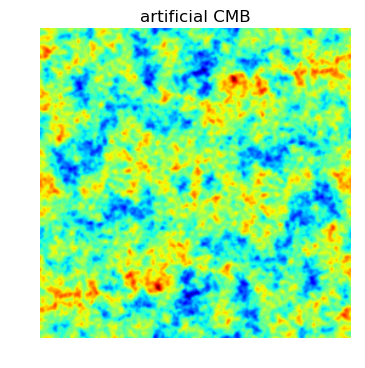

In [110]:
def generate_artificial_cmb(pow_spec):
    """
    Generates samples of CMB of same size as the input pow_spec
    and according to the pow_spec representation
    """
    size_1, size_2 = pow_spec.shape
    pure_noise = np.random.randn(size_1, size_2)
    fourrier_cmb = np.sqrt(pow_spec)*pure_noise
    theoric_cmb = np.fft.ifft2(np.fft.fftshift(fourrier_cmb))
    return np.real(theoric_cmb)
# print(np.mean(generate_artificial_cmb(pow_spec)))
theoric_cmb = generate_artificial_cmb(pow_spec)
plt.axis("off")
plt.imshow(theoric_cmb, cmap='jet')
plt.title("artificial CMB")
plt.show()


We have generated a sample of CMB as a 256\*256 pixels image, up to a scaling factor.

# Annexe 3 :  Ground truth

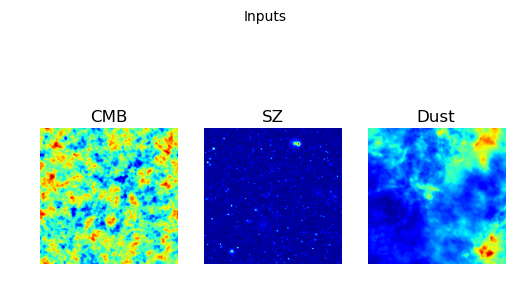

In [85]:
fig = plt.figure()
ax1 = fig.add_subplot(131)
ax1.imshow(cmb_5arcmin)
ax1.set_title('CMB')
ax1.axis('off') 
ax2 = fig.add_subplot(132)
ax2.imshow(sz_5arcmin)
ax2.set_title('SZ')
ax2.axis('off')
ax3 = fig.add_subplot(133)
ax3.imshow(dust_5arcmin)
ax3.set_title('Dust')
ax3.axis('off')
fig.suptitle('Inputs')
plt.show()